# 6. Result Visualization

Final results visualization based on the CSV statistics evaluation metrices generated from previous notebook 2

- Author:
    - [Chen Lequn](https://www.linkedin.com/in/lequn-chen-433040159)
    - [Muhammad Tayyab Khan](https://www.linkedin.com/in/mtayyabkhan/)

#### Run this code to visaulize the model performances across different experiments


### Load the results csv

In [2]:
import matplotlib.pyplot as plt
import scienceplots

In [3]:
import os
import pandas as pd
import json

# Define the list of models and experiments
models = ["MiniCPM", "MiniCPM-V2.6", "Llava_v1_6_mistral_7b", "GPT-4o", "Claude-3.5", "Claude-3"] 
experiments_all = [
    "Exp_1_Basic_Prompts",
    "Exp_2_Improved_Prompts",
    "Exp_3_Multi_View",
    "Exp_4a_Multi_View_Few_Shot",
    "Exp_4b_Multi_View_Chain_of_Thougths",
    "Exp_5_Multi_View_Few_Shot_Chain_of_thoughts"
]

# Define the base directory for results
Results_dir = os.path.join('..', 'Results')
CSV_Results_dir = os.path.join(Results_dir, "LLM_AFR", "CSV_results")
ground_truth_dir = os.path.join(Results_dir, "LLM_AFR", 'Test_Cases_STEP_Ground_Truth')


all_category_stats_csv_path = os.path.join(CSV_Results_dir, 'all_category_stats.csv')
all_feature_analysis_csv_path = os.path.join(CSV_Results_dir, 'all_feature_analysis.csv')

In [4]:
df_all_category_stats = pd.read_csv(all_category_stats_csv_path)

# Display the first few rows of the DataFrame
df_all_category_stats

,category,true_positive_quantity,ground_truth_quantity,hallucinated_quantity,predicted_quantity,total_absolute_error,total_correctly_identified_names,total_ground_truth_names,accuracy,feature_name_matching_rate,hallucination_rate,mae,Model,Experiment
0,easy,85,115,11,111,56,53,67,73.913043,79.104478,9.909910,0.835821,GPT-4o,Exp_1_Basic_Prompts
1,hard,199,448,48,253,303,73,121,44.419643,60.330579,18.972332,2.504132,GPT-4o,Exp_1_Basic_Prompts
2,medium,142,241,17,162,119,65,104,58.921162,62.500000,10.493827,1.144231,GPT-4o,Exp_1_Basic_Prompts
3,overall,426,804,76,526,478,191,292,52.985075,65.410959,14.448669,4.780000,GPT-4o,Exp_1_Basic_Prompts
4,easy,82,115,13,110,61,50,67,71.304348,74.626866,11.818182,0.910448,GPT-4o,Exp_2_Improved_Prompts
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,overall,218,804,307,549,917,176,292,27.114428,60.273973,55.919854,9.170000,Llava_v1_6_mistral_7b,Exp_4b_Multi_View_Chain_of_Thougths
140,easy,14,115,162,180,267,11,67,12.173913,16.417910,90.000000,3.985075,Llava_v1_6_mistral_7b,Exp_5_Multi_View_Few_Shot_Chain_of_thoughts
141,hard,35,448,174,210,588,22,121,7.812500,18.181818,82.857143,4.859504,Llava_v1_6_mistral_7b,Exp_5_Multi_View_Few_Shot_Chain_of_thoughts
142,medium,31,241,131,171,350,23,104,12.863071,22.115385,76.608187,3.365385,Llava_v1_6_mistral_7b,Exp_5_Multi_View_Few_Shot_Chain_of_thoughts


### Individual model analysis
- we visualize the performance for each individual vision language model across different experiment (exp 1-5).
- We plot the 4 plots for four different performances: accuracy, feature_name_matching_rate, hallucination_rate, and mae. They will be the y-axis in the plot
- For the X-axis, it will be the experiment 1, experiment 2, ......5
- There are different LLM models, and each model is represented using different colour

In [5]:
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# Experiment display names for better readability
experiment_display_names = [
    "Exp 1: Zero-shot",
    "Exp 2: Zero-shot + Sequential",
    "Exp 3: Zero-shot + Multi-View",
    "Exp 4: Few-shot + Multi-View",
    "Exp 5: Zero-shot + Multi-View\nChain-of-Thoughts",
    "Exp 6: Few-shot + Multi-View\nChain-of-Thoughts"
]
experiment_mapping = dict(zip(experiments_all, experiment_display_names))

# Filter data and map experiment names
df_all_category_stats['Experiment'] = df_all_category_stats['Experiment'].map(experiment_mapping)
filtered_data = df_all_category_stats[df_all_category_stats['Experiment'].isin(experiment_display_names)]

# Define the metrics to plot and their display names
metrics = ['accuracy', 'feature_name_matching_rate', 'hallucination_rate', 'mae']
metrics_display_names = ['Feature quantity accuracy', 'Feature name accuracy', 'Hallucination Rate', 'MAE']
categories = ['easy', 'hard', 'medium', 'overall']

In [6]:
filtered_data

,category,true_positive_quantity,ground_truth_quantity,hallucinated_quantity,predicted_quantity,total_absolute_error,total_correctly_identified_names,total_ground_truth_names,accuracy,feature_name_matching_rate,hallucination_rate,mae,Model,Experiment
0,easy,85,115,11,111,56,53,67,73.913043,79.104478,9.909910,0.835821,GPT-4o,Exp 1: Zero-shot
1,hard,199,448,48,253,303,73,121,44.419643,60.330579,18.972332,2.504132,GPT-4o,Exp 1: Zero-shot
2,medium,142,241,17,162,119,65,104,58.921162,62.500000,10.493827,1.144231,GPT-4o,Exp 1: Zero-shot
3,overall,426,804,76,526,478,191,292,52.985075,65.410959,14.448669,4.780000,GPT-4o,Exp 1: Zero-shot
4,easy,82,115,13,110,61,50,67,71.304348,74.626866,11.818182,0.910448,GPT-4o,Exp 2: Zero-shot + Sequential
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,overall,218,804,307,549,917,176,292,27.114428,60.273973,55.919854,9.170000,Llava_v1_6_mistral_7b,Exp 5: Zero-shot + Multi-View\nChain-of-Thoughts
140,easy,14,115,162,180,267,11,67,12.173913,16.417910,90.000000,3.985075,Llava_v1_6_mistral_7b,Exp 6: Few-shot + Multi-View\nChain-of-Thoughts
141,hard,35,448,174,210,588,22,121,7.812500,18.181818,82.857143,4.859504,Llava_v1_6_mistral_7b,Exp 6: Few-shot + Multi-View\nChain-of-Thoughts
142,medium,31,241,131,171,350,23,104,12.863071,22.115385,76.608187,3.365385,Llava_v1_6_mistral_7b,Exp 6: Few-shot + Multi-View\nChain-of-Thoughts


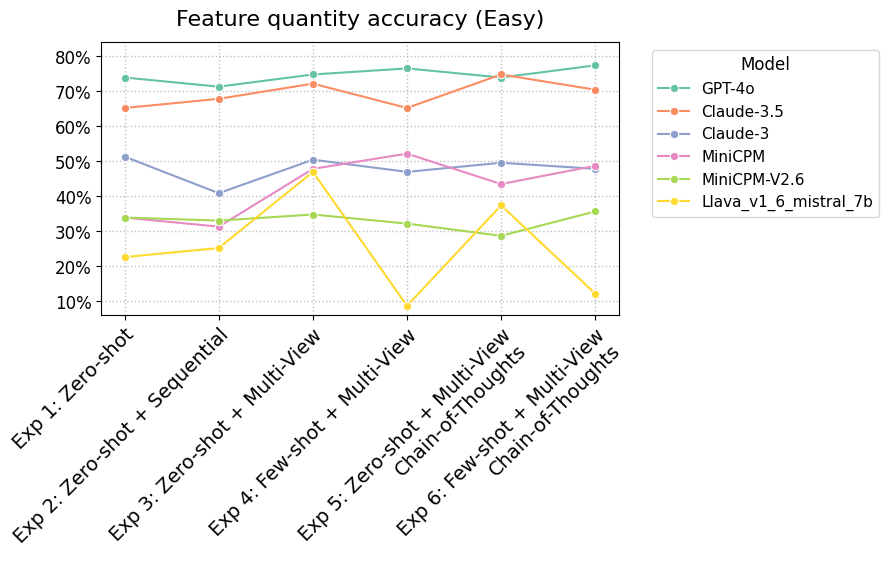

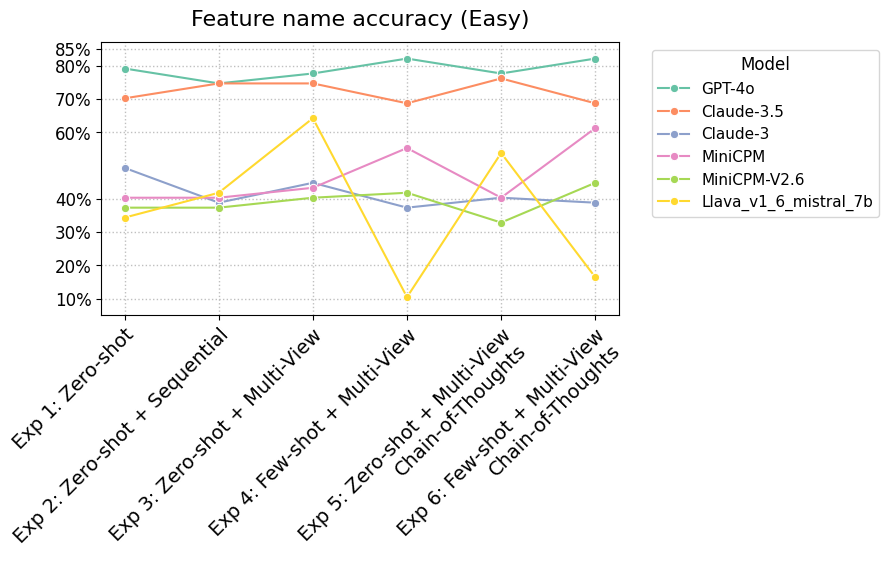

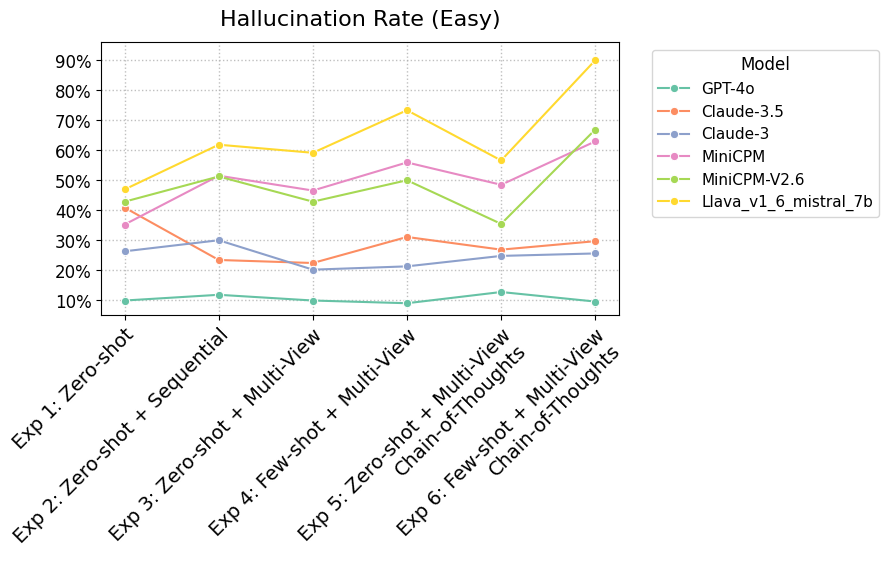

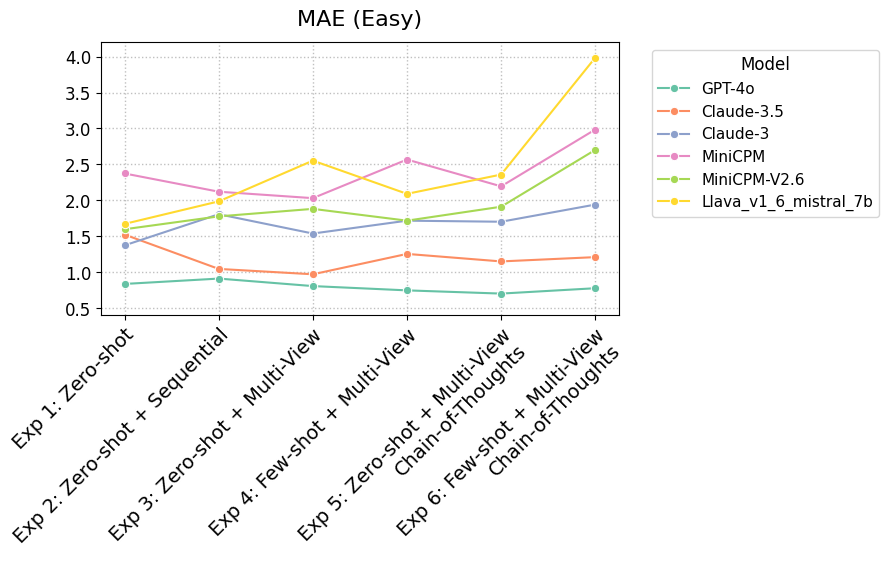

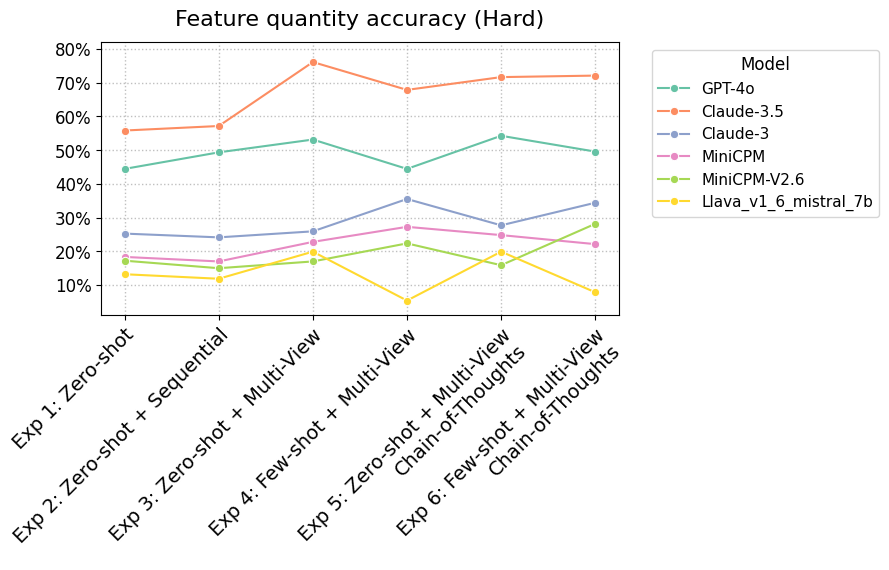

...

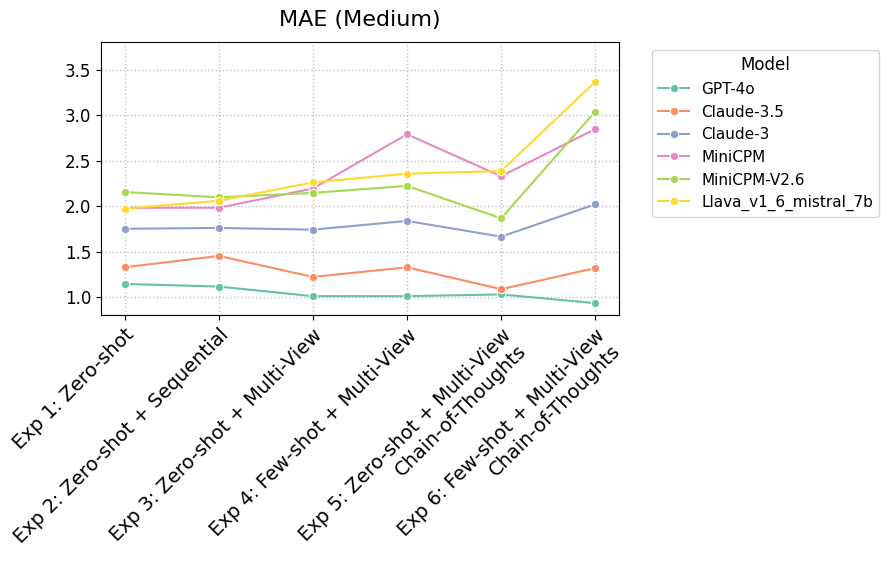

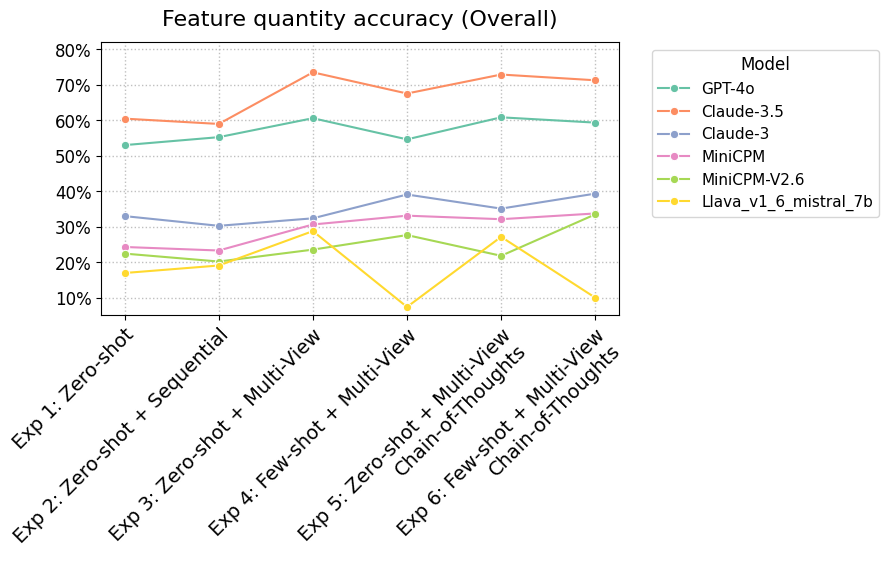

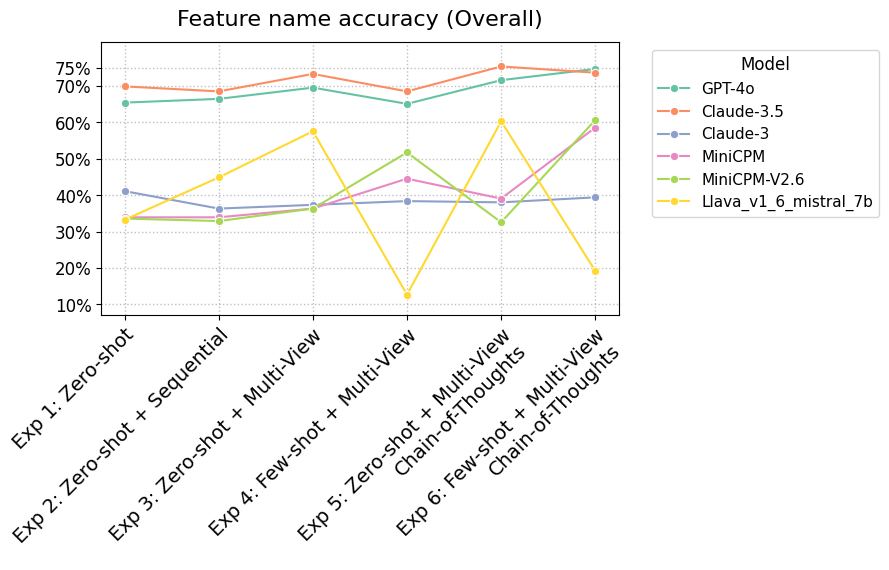

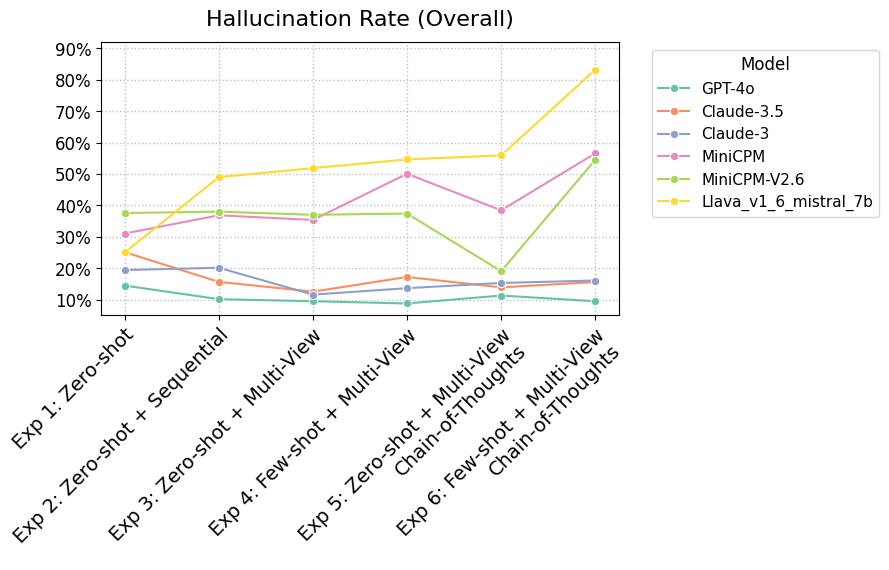

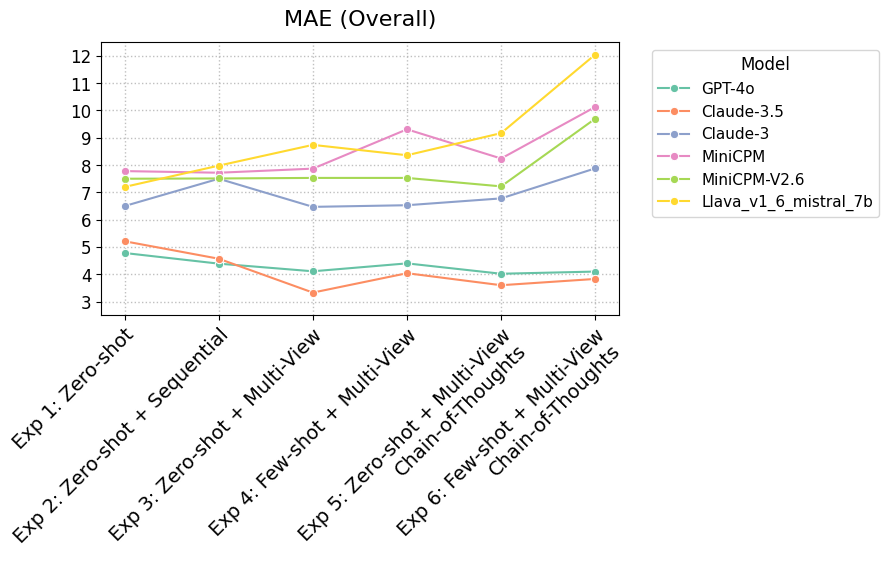

In [8]:
# Adjust figure size for better width and height ratio
figure_width = 9
figure_height = 6
# Create a new color palette for the different models
palette = sns.color_palette("Set2", len(models))

# Function to format the Y-axis with a percentage sign
def add_percentage(x, pos):
    return f'{x:.0f}%'

plt.rcParams['legend.title_fontsize'] = 12
# Plot each metric separately for each category
for category in categories:
    category_data = filtered_data[filtered_data['category'] == category]
    
    for metric, metric_display in zip(metrics, metrics_display_names):
        plt.figure(figsize=(figure_width, figure_height))
        sns.lineplot(data=category_data, x='Experiment', y=metric, hue='Model', marker='o', palette=palette)
        plt.title(f'{metric_display} ({category.capitalize()})', fontsize=16, color='black', pad=12)
        # plt.ylabel(metric_display, fontsize=14, color='black',labelpad = 10)
        plt.xticks(rotation=45, fontsize=14, color='black', ha='right', rotation_mode='anchor')
        plt.yticks(fontsize=12, color='black')
        plt.grid(True, linestyle=':', linewidth=1, alpha=0.8)
        plt.legend(title='Model', bbox_to_anchor=(1.05, 1), fontsize=11, loc='upper left')
        plt.tight_layout()
        plt.xlabel('')  # Remove X-axis label
        plt.ylabel('')  # Remove X-axis label

 
        if metric == 'accuracy':
            if category.capitalize() == "Easy":
                plt.ylim(6, 84)
            elif category.capitalize() == "Overall":
                plt.ylim(5, 82)
            elif category.capitalize() == "Hard":
                plt.ylim(1, 82)
            elif category.capitalize() == "Medium":
                plt.ylim(7, 81)
                
        if metric == 'feature_name_matching_rate':
            if category.capitalize() == "Easy":
                plt.yticks([10, 20, 30, 40, 60, 70, 80, 85])
                plt.ylim(5, 87)
            elif category.capitalize() == "Hard":
                plt.ylim(6, 82)
            elif category.capitalize() == "Medium":
                plt.yticks([20, 30, 40, 50, 60, 70, 75])
                plt.ylim(12, 84)
            elif category.capitalize() == "Overall":
                plt.yticks([10, 20, 30, 40, 50, 60, 70, 75])
                plt.ylim(7, 82)

        if metric == 'hallucination_rate':
            if category.capitalize() == "Easy":
                plt.yticks([10, 20, 30, 40, 50, 60, 70, 80, 90])
                plt.ylim(5, 96)
            elif category.capitalize() == "Hard":
                plt.yticks([0, 5, 10, 20, 30, 40, 50, 60, 70, 80])
                plt.ylim(0, 86)
            elif category.capitalize() == "Medium":
                plt.yticks([10, 20, 30, 40, 50, 60, 70, 80])
                plt.ylim(4, 83)
            elif category.capitalize() == "Overall":
                plt.yticks([10, 20, 30, 40, 50, 60, 70, 80, 90])
                plt.ylim(5, 92)

        if metric == 'mae':
            if category.capitalize() == "Easy":
                plt.ylim(0.4, 4.2)
            elif category.capitalize() == "Hard":
                # plt.yticks([0.06, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.37])
                plt.ylim(0.8, 5.3)
            elif category.capitalize() == "Medium":
                # plt.yticks([0.03, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.37])
                plt.ylim(0.8, 3.8)
            elif category.capitalize() == "Overall":
                plt.yticks([3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
                plt.ylim(2.5, 12.5)

    

        # Format Y-axis as percentage for specified metrics
        if metric in ['accuracy', 'feature_name_matching_rate', 'hallucination_rate']:
            plt.gca().yaxis.set_major_formatter(FuncFormatter(add_percentage))

        # plt.savefig(os.path.join(Results_dir, "LLM_AFR", "Visualization", "Experiment_Model_Analaysis_Category", f'{metric}_{category}.png'))  # Save the plot with a name reflecting the metric and category
        # plt.show()
        # Save the figure with high resolution
        plt.savefig(
            os.path.join(Results_dir, "LLM_AFR", "Visualization", "Experiment_Model_Analaysis_Category", f'{metric}_{category}.png'),
            dpi=600,  # Set the dpi value to 300 or higher for better resolution
            bbox_inches='tight'  # Optional: To remove extra white spaces around the figure
        )

/tmp/ipykernel_224808/4117633788.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(figure_width, figure_height))


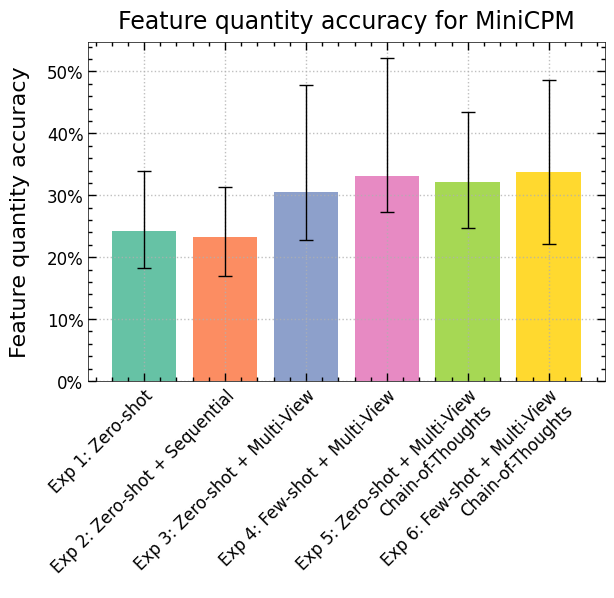

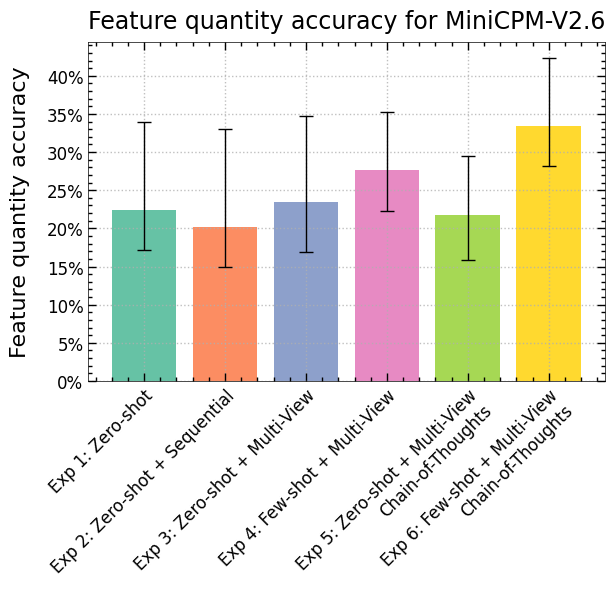

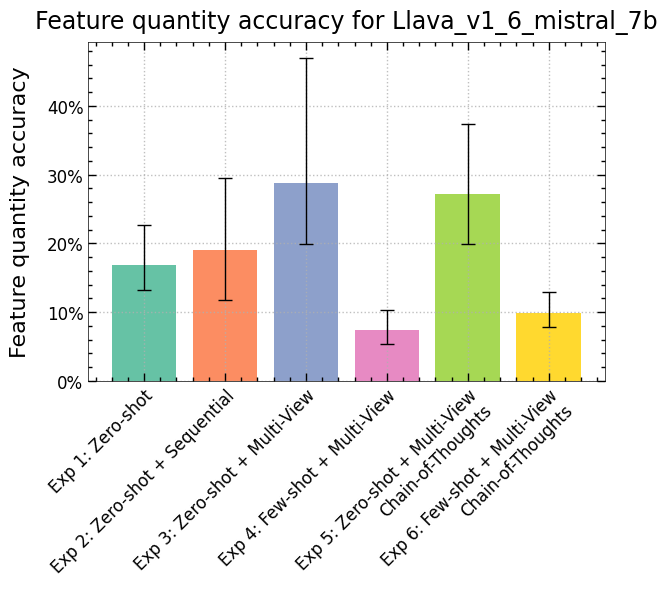

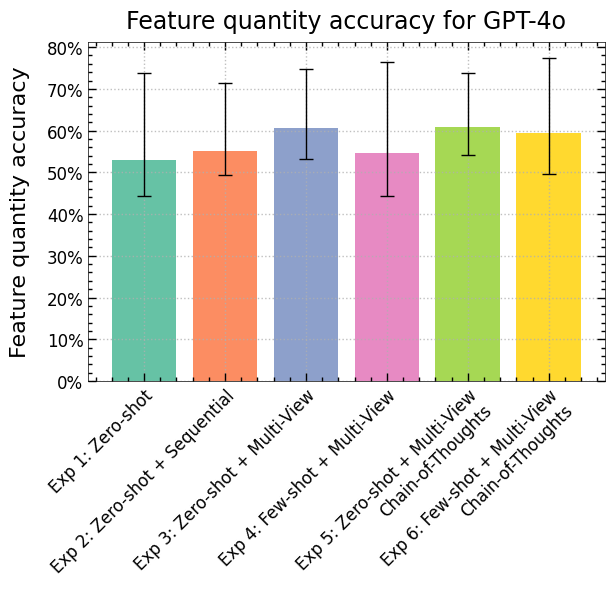

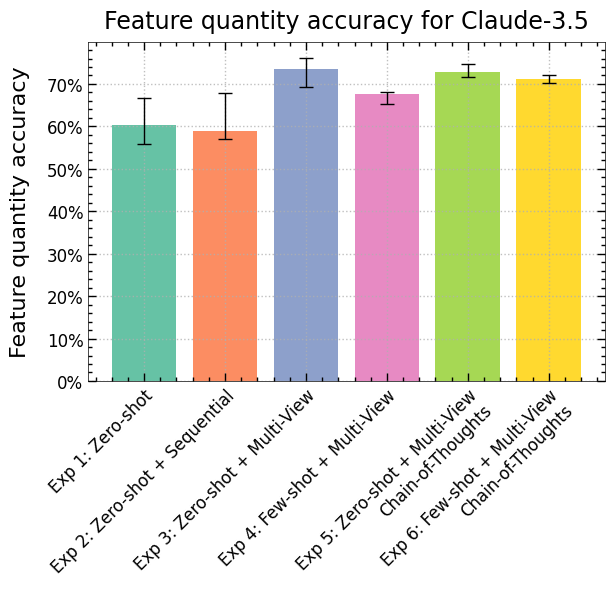

...

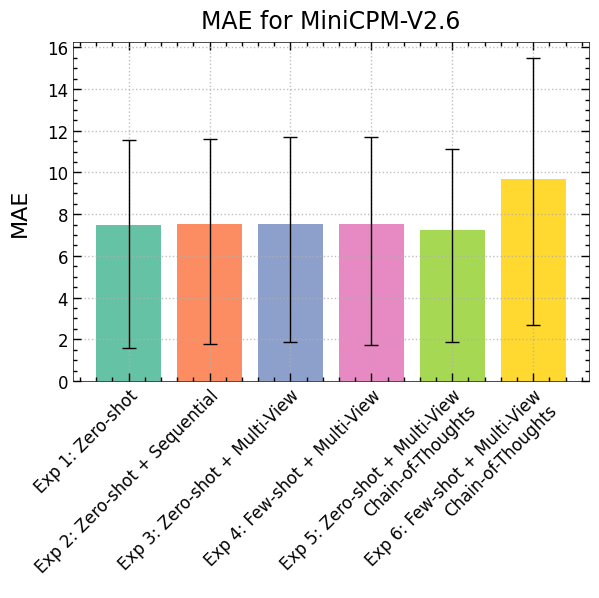

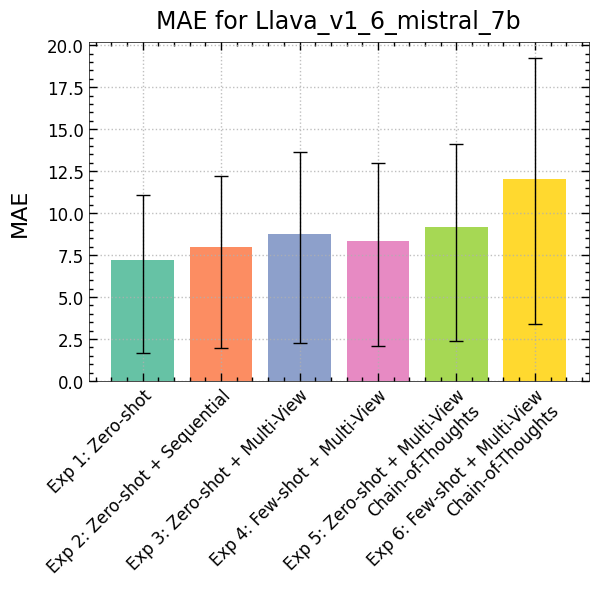

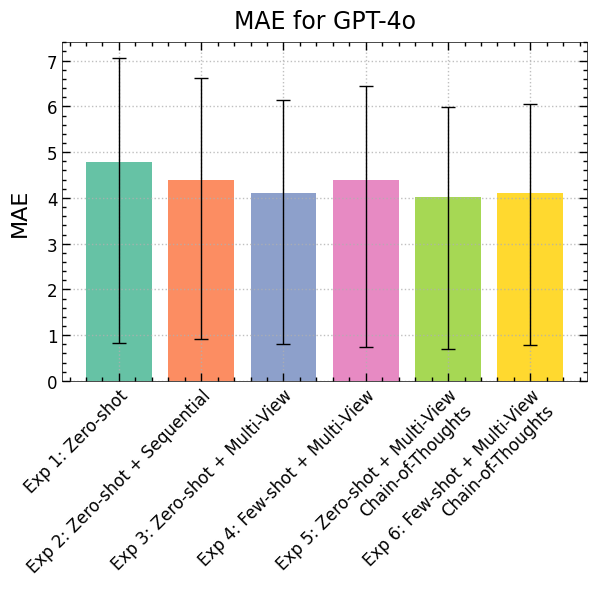

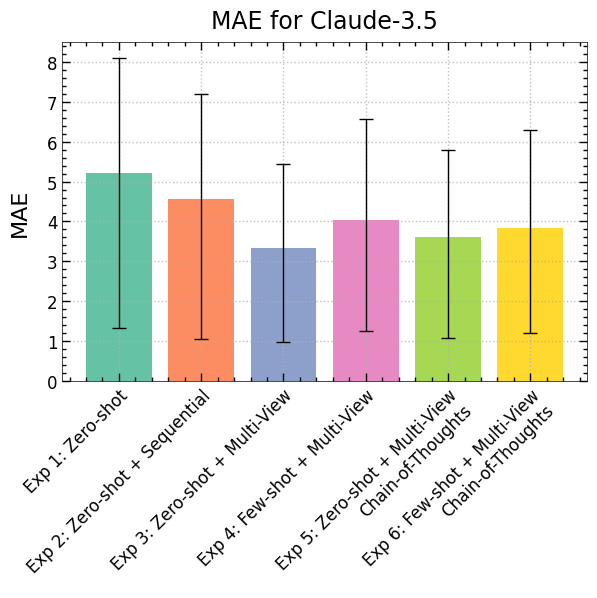

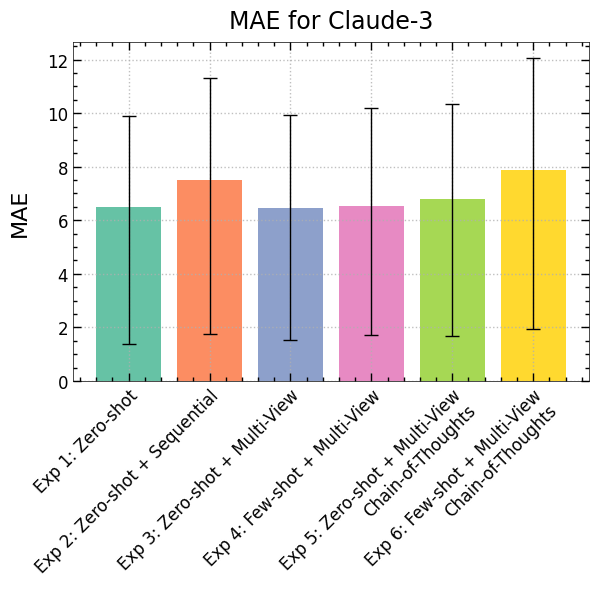

In [10]:
import numpy as np
figure_width = 6
figure_height = 6

# Function to create bar plots with error bars
def plot_with_error_bars(metric, metric_display, models, experiment_display_names):
    for model in models:
        with plt.style.context(['science','notebook', "nature"]):
            plt.figure(figsize=(figure_width, figure_height))
            model_data = filtered_data[filtered_data['Model'] == model]
            
            means = model_data[model_data['category'] == 'overall'][metric].values
            easy_values = model_data[model_data['category'] == 'easy'][metric].values
            hard_values = model_data[model_data['category'] == 'hard'][metric].values
            medium_values = model_data[model_data['category'] == 'medium'][metric].values
    
            all_values = np.vstack([easy_values, hard_values, medium_values])
            min_values = np.min(all_values, axis=0)
            max_values = np.max(all_values, axis=0)
    
            lower_errors = np.abs(means - min_values)
            upper_errors = np.abs(max_values - means)
    
            plt.bar(experiment_display_names, means, yerr=[lower_errors, upper_errors], capsize=5, color=palette)
    
            plt.title(f'{metric_display} for {model}', fontsize=17, color='black', pad=10)
            plt.ylabel(metric_display, fontsize=16, color='black', labelpad=12)
            # plt.xticks(rotation=40, fontsize=12, color='black', ha='center')
            plt.xticks(rotation=45, fontsize=12, color='black', ha='right', rotation_mode='anchor')
            plt.yticks(fontsize=12, color='black')
            plt.grid(True, linestyle=':', linewidth=1, alpha=0.8)
            plt.tight_layout()
            plt.xlabel('')  # Remove X-axis label
            
            # Format Y-axis as percentage for specified metrics
            if metric in ['accuracy', 'feature_name_matching_rate', 'hallucination_rate']:
                plt.gca().yaxis.set_major_formatter(FuncFormatter(add_percentage))
            
            # Show plot inline (can be changed to save as needed)
            plt.savefig(
                os.path.join(Results_dir, "LLM_AFR", "Visualization", "Experiment_Model_Analaysis", f'{metric}_{model}.png'),
                dpi=600,  # Set the dpi value to 300 or higher for better resolution
                bbox_inches='tight'  # Optional: To remove extra white spaces around the figure
            )

# Generate plots for each metric
for metric, metric_display in zip(metrics, metrics_display_names):
    plot_with_error_bars(metric, metric_display, models, experiment_display_names)
    


### Best Performing models comparison

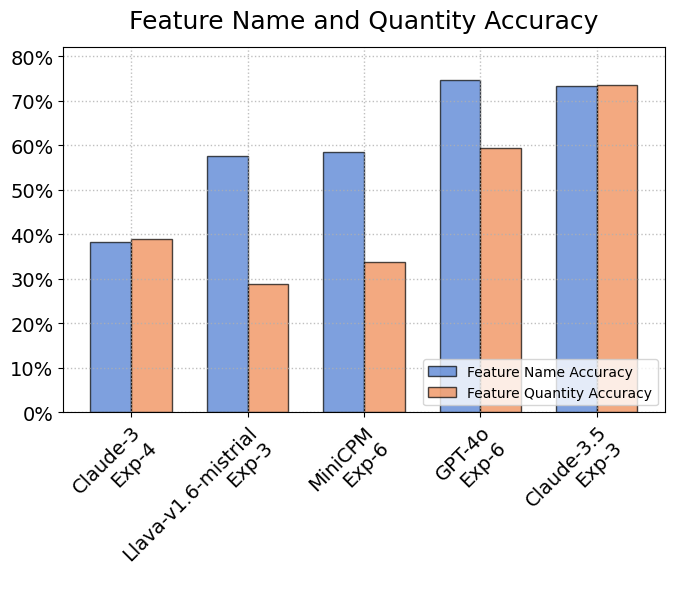

In [8]:
import numpy as np

# Experiment display names for better readability
experiment_display_names = [
    "Exp 1: Zero-shot",
    "Exp 2: Zero-shot + Sequential",
    "Exp 3: Zero-shot + Multi-View",
    "Exp 4: Few-shot + Multi-View",
    "Exp 5: Zero-shot + Multi-View\nChain-of-Thoughts",
    "Exp 6: Few-shot + Multi-View\nChain-of-Thoughts"
]

# Updated best experiments with full names for data filtering
# Best experiment is based highest feature quantity accuracy score for each model
best_experiments = {
    "GPT-4o": "Exp 6: Few-shot + Multi-View\nChain-of-Thoughts",
    "Claude-3.5": "Exp 3: Zero-shot + Multi-View",
    "Claude-3": "Exp 4: Few-shot + Multi-View",
    "MiniCPM": "Exp 6: Few-shot + Multi-View\nChain-of-Thoughts",
    "Llava_v1_6_mistral_7b": "Exp 3: Zero-shot + Multi-View", 
}

# Concise names for display on X-axis
concise_experiments = {
    "GPT-4o": "Exp-6",
    "Claude-3.5": "Exp-3",
    "Claude-3": "Exp-4",
    "MiniCPM": "Exp-6", 
    "Llava_v1_6_mistral_7b": "Exp-3"
}

# Order of models for X-axis
model_order = ["Claude-3", "Llava_v1_6_mistral_7b", "MiniCPM", "GPT-4o", "Claude-3.5"] #
figure_width = 7
figure_height = 6

# Function to plot combined bar plots for two metrics
def plot_combined_metrics(models, metrics, metric_display_names, best_experiments, concise_experiments, ylabel, title, y_range=None, show_legend=False):
    plt.figure(figsize=(figure_width, figure_height))
    
    indices = np.arange(len(models))
    bar_width = 0.35
    colors = sns.color_palette("muted", len(metrics)) 

    for i, model in enumerate(models):
        experiment = best_experiments[model]
        model_data = filtered_data[(filtered_data['Model'] == model) & (filtered_data['Experiment'] == experiment)]
        
        if not model_data.empty:
            for j, (metric, display_name) in enumerate(zip(metrics, metric_display_names)):
                value = model_data[model_data['category'] == 'overall'][metric].values[0]
                plt.bar(indices[i] + j * bar_width - bar_width / 2, value, bar_width, color=colors[j], edgecolor='black', linewidth=1, alpha=0.7, label=display_name if i == 0 and show_legend else "")
    
    # plt.xlabel('Models and Experiments', fontsize=14, color='black')
    plt.ylabel(ylabel, fontsize=16, color='black', labelpad=10)
    plt.title(title, fontsize=18, color='black', pad=14)
    plt.xticks(indices, [f'{model if model != "Llava_v1_6_mistral_7b" else "Llava-v1.6-mistrial"}'+ "\n" + f'{concise_experiments[model]}' for model in models], rotation=45, 
               fontsize=14, color='black', ha='right', rotation_mode='anchor')
    plt.yticks(fontsize=14, color='black')
    plt.tight_layout()
    plt.grid(True, linestyle=':', linewidth=1, alpha=0.8)
    
    if show_legend:
        plt.legend(loc='lower right')

    if y_range:
        plt.ylim(y_range)

    # Format Y-axis as percentage for specified metrics
    if ylabel == 'Percentage':
        plt.gca().yaxis.set_major_formatter(FuncFormatter(add_percentage))

    plt.ylabel('')
    
    # plt.show()
    # plt.savefig(os.path.join(Results_dir, "LLM_AFR", "Visualization", 'Best_Experiment_accuracy.png'))
    plt.savefig(
                os.path.join(Results_dir, "LLM_AFR", "Visualization", 'Best_Experiment_accuracy.png'),
                dpi=600,  # Set the dpi value to 300 or higher for better resolution
                bbox_inches='tight'  # Optional: To remove extra white spaces around the figure
            )

# Combined plot for feature_name_matching_rate and accuracy
combined_metrics = ['feature_name_matching_rate', 'accuracy']
combined_metric_display_names = ['Feature Name Accuracy', 'Feature Quantity Accuracy']
plot_combined_metrics(model_order, combined_metrics, combined_metric_display_names, best_experiments, concise_experiments, 
                      'Percentage', 'Feature Name and Quantity Accuracy', y_range=(0, 82), show_legend=True)

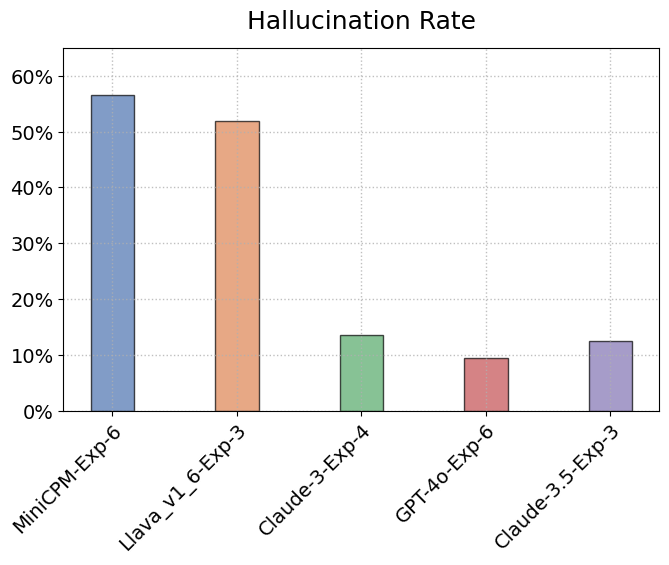

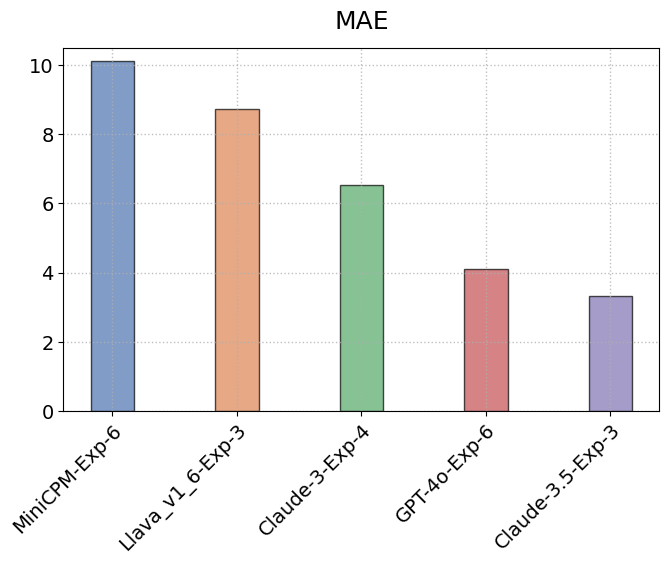

In [9]:
figure_width = 7
figure_height = 6
# Function to plot single metric bar plots with centered bars
def plot_single_metric(models, metric, metric_display_name, best_experiments, concise_experiments, ylabel, title, y_range=None):
    plt.figure(figsize=(figure_width, figure_height))
    
    indices = np.arange(len(models))
    bar_width = 0.35
    color = sns.color_palette("deep", len(models))  # Select a distinct color set for the remaining plots

    for i, model in enumerate(models):
        experiment = best_experiments[model]
        model_data = filtered_data[(filtered_data['Model'] == model) & (filtered_data['Experiment'] == experiment)]
        
        if not model_data.empty:
            value = model_data[model_data['category'] == 'overall'][metric].values[0]
            plt.bar(indices[i], value, bar_width, color=color[i], edgecolor='black', linewidth=1, alpha=0.7)
    
    plt.xlabel('Models and Experiments', fontsize=14, color='black')
    plt.ylabel(ylabel, fontsize=14, color='black', labelpad=15)
    plt.title(title, fontsize=18, color='black', pad=14)
    # plt.xticks(indices, [f'{model}-{concise_experiments[model]}' for model in models], rotation=45, fontsize=12, color='black')
    plt.xticks(indices, [f'{model if model != "Llava_v1_6_mistral_7b" else "Llava_v1_6"}-{concise_experiments[model]}' for model in models], rotation=45, 
               fontsize=14, color='black', ha='right', rotation_mode='anchor')
    plt.yticks(fontsize=14, color='black')
    plt.tight_layout()
    plt.grid(True, linestyle=':', linewidth=1, alpha=0.8)

    if y_range:
        plt.ylim(y_range)

    # Format Y-axis as percentage for specified metrics
    if ylabel == 'Percentage':
        plt.gca().yaxis.set_major_formatter(FuncFormatter(add_percentage))
    
    # plt.show()
    plt.ylabel('')
    plt.xlabel('')
    
    # plt.savefig(os.path.join(Results_dir, "LLM_AFR", "Visualization", f'Best_experiment_{title}.png'))
    plt.savefig(
                os.path.join(Results_dir, "LLM_AFR", "Visualization", f'Best_experiment_{title}.png'),
                dpi=600,  # Set the dpi value to 300 or higher for better resolution
                bbox_inches='tight'  # Optional: To remove extra white spaces around the figure
            )



# Order of models for X-axis
model_order = [ "MiniCPM", "Llava_v1_6_mistral_7b",  "Claude-3","GPT-4o", "Claude-3.5"] #


# Separate plots for hallucination_rate and MAE
plot_single_metric(model_order, 'hallucination_rate', 'Hallucination Rate', best_experiments, concise_experiments, 'Percentage', 'Hallucination Rate', y_range=(0, 65))

plot_single_metric(model_order, 'mae', 'MAE', best_experiments, concise_experiments, 'MAE', 'MAE', y_range=(0, 10.5))

## Feature-level analysis

### Load the results csv

In [10]:
# Define the list of models and experiments
models = ["GPT-4o", "Claude-3.5", "Claude-3","MiniCPM", "Llava_v1_6_mistral_7b"] # "", "Llava_v1_6_mistral_7b" ,"GPT-4o", "Claude-3.5", "Claude-3", 
# experiments_all = [
#     "Exp_1_Basic_Prompts",
#     "Exp_2_Improved_Prompts",
#     "Exp_3_Multi_View",
#     "Exp_4a_Multi_View_Few_Shot",
#     "Exp_4b_Multi_View_Chain_of_Thougths",
#     "Exp_5_Multi_View_Few_Shot_Chain_of_thoughts"
# ]

# Define the base directory for results
Results_dir = os.path.join('..', 'Results')
CSV_Results_dir = os.path.join(Results_dir, "LLM_AFR", "CSV_results")
ground_truth_dir = os.path.join(Results_dir, "LLM_AFR", 'Test_Cases_STEP_Ground_Truth')


all_category_stats_csv_path = os.path.join(CSV_Results_dir, 'all_category_stats.csv')
all_feature_analysis_csv_path = os.path.join(CSV_Results_dir, 'all_feature_analysis.csv')

In [11]:
df_feature_analysis = pd.read_csv(all_feature_analysis_csv_path)

# Display the first few rows of the DataFrame
df_feature_analysis

,Feature name,Overall Accuracy,Overall Hallucination Rate,Easy Accuracy,Easy Hallucination Rate,Medium Accuracy,Medium Hallucination Rate,Hard Accuracy,Hard Hallucination Rate,Model,Experiment
0,Boss (Circular / Obround / Irregular / Rectang...,0.480000,0.142857,1.0,0.125000,0.190476,0.200000,0.590909,0.133333,GPT-4o,Exp_1_Basic_Prompts
1,Chamfer / Bevel (Sharp Edge),0.416667,0.444444,0.5,0.000000,0.333333,0.500000,0.000000,1.000000,GPT-4o,Exp_1_Basic_Prompts
2,Draft,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,GPT-4o,Exp_1_Basic_Prompts
3,Fillet / Round (Concave / Convex),0.570093,0.129870,1.0,0.235294,0.392857,0.142857,0.567164,0.086957,GPT-4o,Exp_1_Basic_Prompts
4,"Freeform Features (Depression, Protrusion)",0.500000,0.555556,1.0,0.000000,0.000000,1.000000,0.400000,0.666667,GPT-4o,Exp_1_Basic_Prompts
...,...,...,...,...,...,...,...,...,...,...,...
456,Rib,0.000000,1.000000,0.0,1.000000,0.000000,1.000000,0.000000,1.000000,Llava_v1_6_mistral_7b,Exp_5_Multi_View_Few_Shot_Chain_of_thoughts
457,Sheet Metal Features,0.125000,0.977778,0.0,1.000000,0.000000,1.000000,0.166667,0.944444,Llava_v1_6_mistral_7b,Exp_5_Multi_View_Few_Shot_Chain_of_thoughts
458,Slot (Through / Blind / T-Slot / Dovetail),0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,Llava_v1_6_mistral_7b,Exp_5_Multi_View_Few_Shot_Chain_of_thoughts
459,Step (Through / Blind Step),0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,Llava_v1_6_mistral_7b,Exp_5_Multi_View_Few_Shot_Chain_of_thoughts


### Feature-wise Performance
- Evaluate the performance metrics for each feature across different models and experiments.
- Present results in a concise and straightforward manner.
- Key metrics to visualize: Overall Accuracy (rename it to Feature quantity accuracy), Overall Hallucination Rate (rename to Hallucination Rate).

In [12]:
# Define the concise experiment names
concise_experiments = {
    "Exp_1_Basic_Prompts": "Exp-1",
    "Exp_2_Improved_Prompts": "Exp-2",
    "Exp_3_Multi_View": "Exp-3",
    "Exp_4a_Multi_View_Few_Shot": "Exp-4",
    "Exp_4b_Multi_View_Chain_of_Thougths": "Exp-5",
    "Exp_5_Multi_View_Few_Shot_Chain_of_thoughts": "Exp-6"
}



In [13]:
def plot_feature_performance(df, model, experiment, xlabel_size=12, ylabel_size=12, xticks_size=10, yticks_size=10, title_size=14, labelpad=10, titlepad=15):
    # Rename the columns for clarity
    df = df.rename(columns={
        'Overall Accuracy': 'Feature Quantity Accuracy',
        'Overall Hallucination Rate': 'Hallucination Rate'
    })
    
    # Filter the dataframe for the specific model and experiment
    df_filtered = df[(df['Model'] == model) & (df['Experiment'] == experiment)]
    
    # Remove the specified features
    df_filtered = df_filtered[~df_filtered['Feature name'].isin(['Neck', 'Pad', 'Draft'])]
    
    # Group by 'Feature name' and calculate mean metrics for each feature
    feature_performance = df_filtered.groupby('Feature name')[['Feature Quantity Accuracy', 'Hallucination Rate']].mean().reset_index()
    
    # Plotting the Feature Quantity Accuracy in ascending order
    feature_performance.sort_values(by='Feature Quantity Accuracy', ascending=True, inplace=True)
    plt.figure(figsize=(10, 6))
    bars = plt.barh(feature_performance['Feature name'], feature_performance['Feature Quantity Accuracy'], color='skyblue', edgecolor='black')
    plt.xlabel('Feature Quantity Accuracy', fontsize=xlabel_size, labelpad=labelpad)
    plt.title(f'{model} - {concise_experiments[experiment]} Feature Quantity Accuracy', fontsize=title_size, pad=titlepad)
    plt.xticks(fontsize=xticks_size)
    plt.yticks(fontsize=yticks_size)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    # plt.show()
    plt.savefig(os.path.join(Results_dir, "LLM_AFR", "Visualization", "Feature_level_Model_Experiment_Analysis", f'Accuracy_{model}_{experiment}.png')) 
    
    # Plotting the Hallucination Rate in descending order
    feature_performance.sort_values(by='Hallucination Rate', ascending=False, inplace=True)
    plt.figure(figsize=(10, 6))
    bars = plt.barh(feature_performance['Feature name'], feature_performance['Hallucination Rate'], color='salmon', edgecolor='black')
    plt.xlabel('Hallucination Rate', fontsize=xlabel_size, labelpad=labelpad)
    plt.title(f'{model} - {concise_experiments[experiment]} Hallucination Rate', fontsize=title_size, pad=titlepad)
    plt.xticks(fontsize=xticks_size)
    plt.yticks(fontsize=yticks_size)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    # plt.savefig(os.path.join(Results_dir, "LLM_AFR", "Visualization", "Feature_level_Model_Experiment_Analysis", f'Hallucination_{model}_{experiment}.png'))
    plt.savefig(
                os.path.join(Results_dir, "LLM_AFR", "Visualization", "Feature_level_Model_Experiment_Analysis", f'Hallucination_{model}_{experiment}.png'),
                dpi=600,  # Set the dpi value to 300 or higher for better resolution
                bbox_inches='tight'  # Optional: To remove extra white spaces around the figure
            )
    # plt.show()

C:\Users\Asus\AppData\Local\Temp\ipykernel_9336\3121865906.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


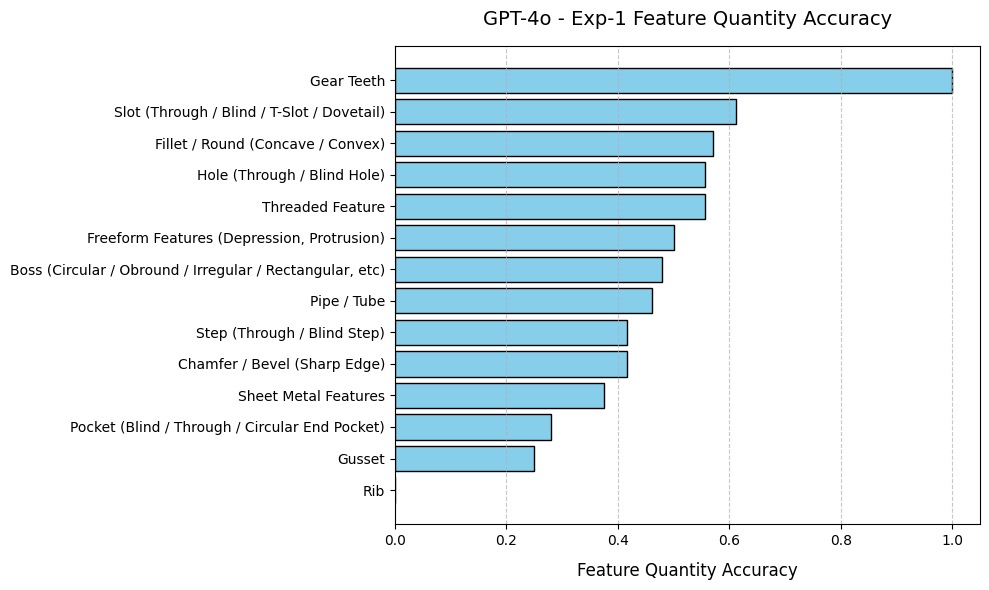

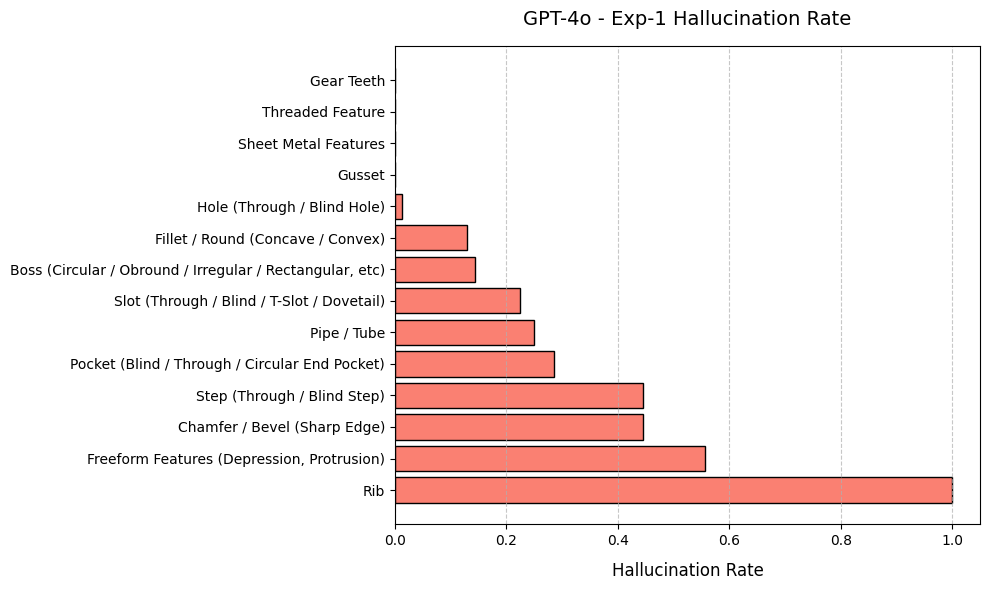

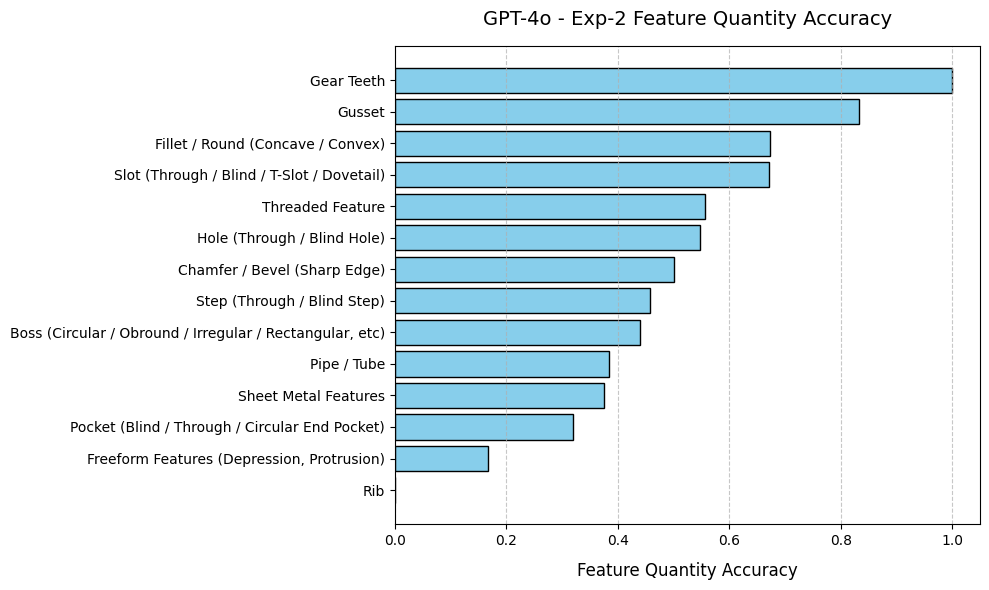

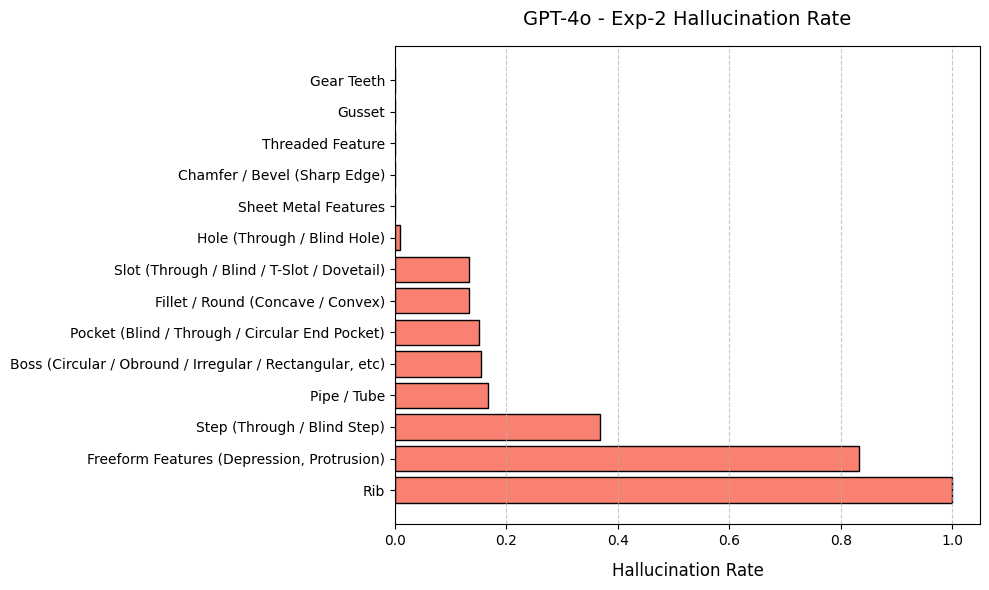

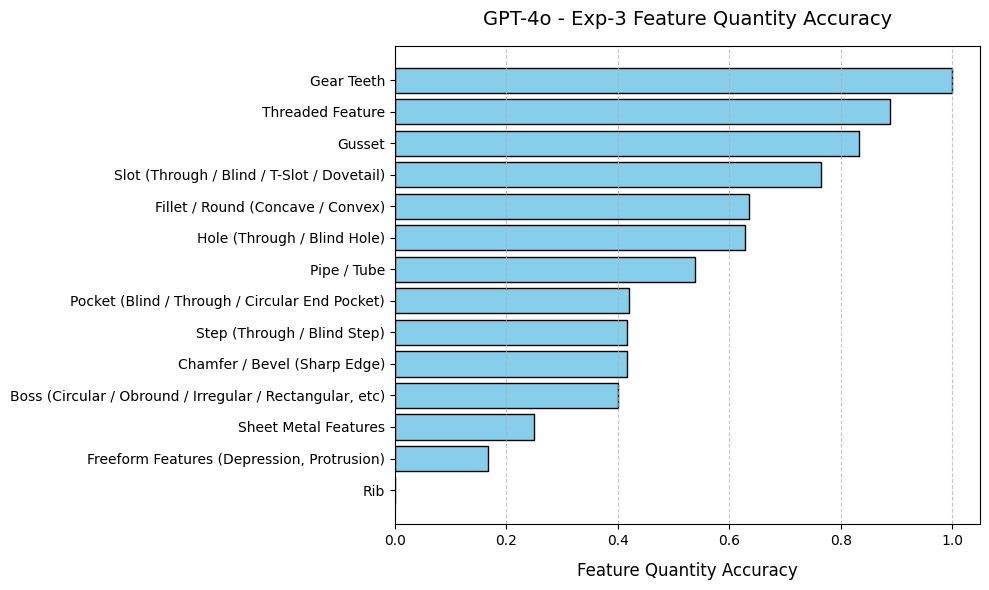

...

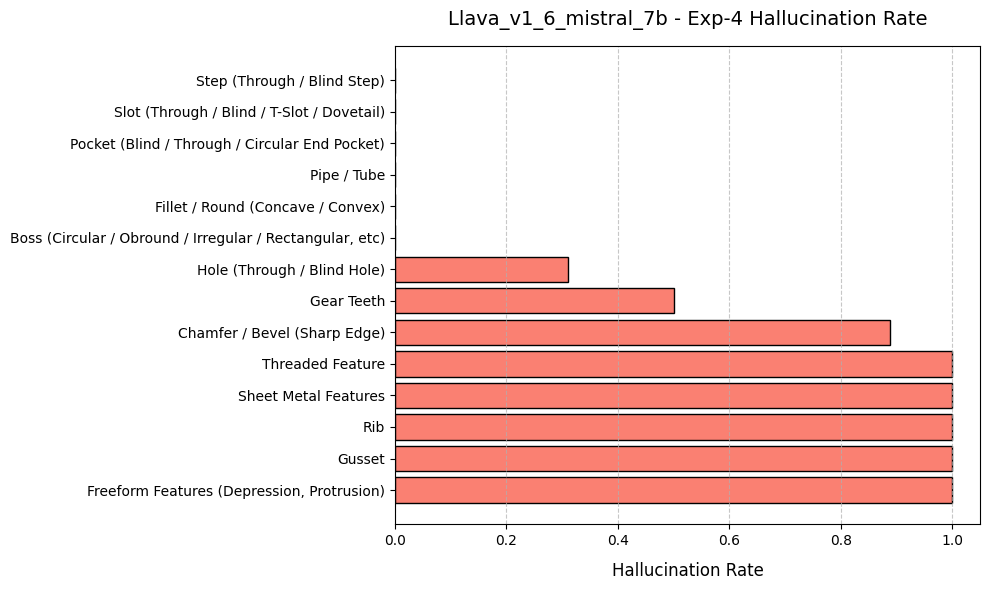

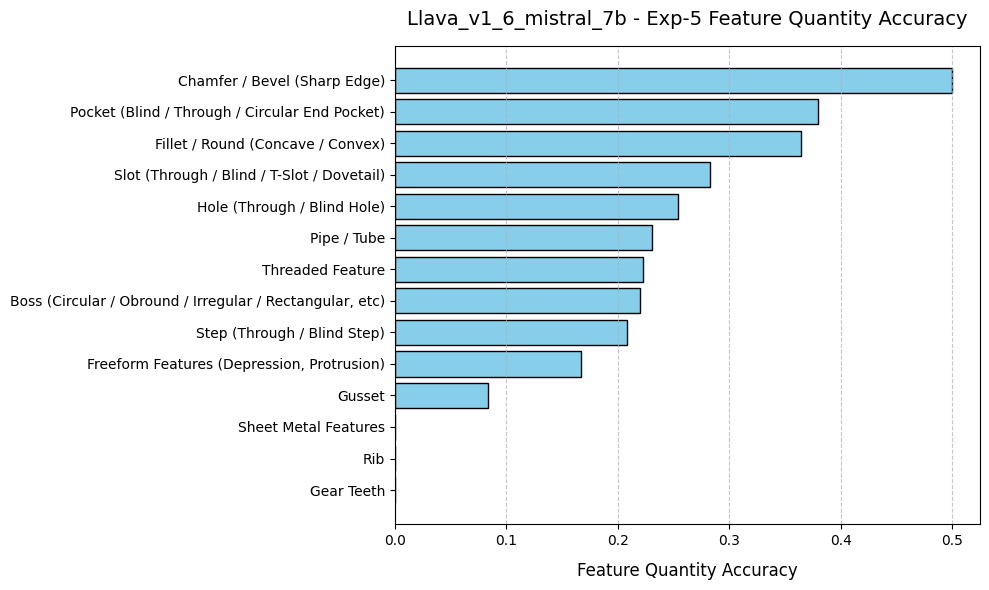

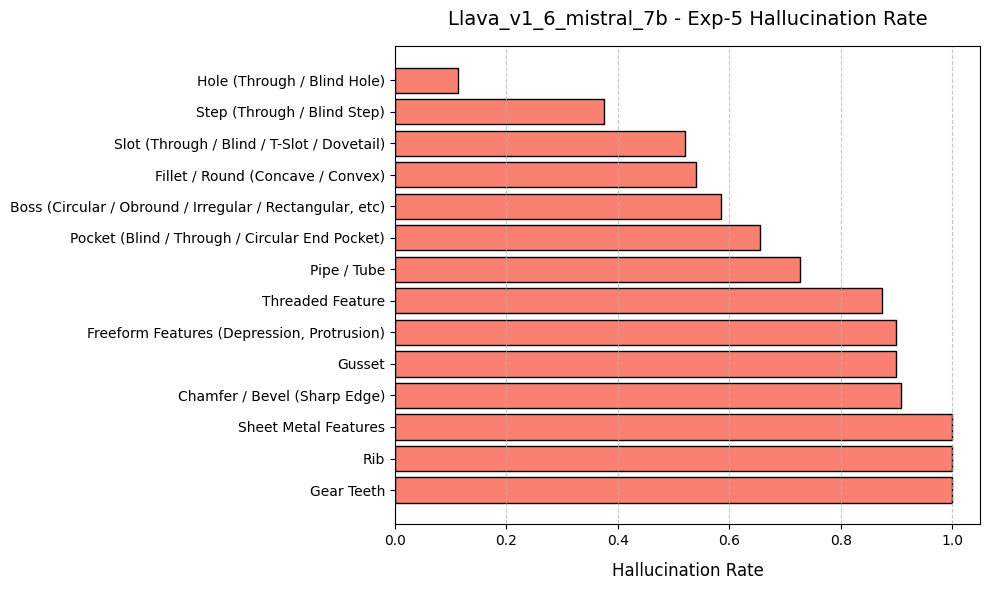

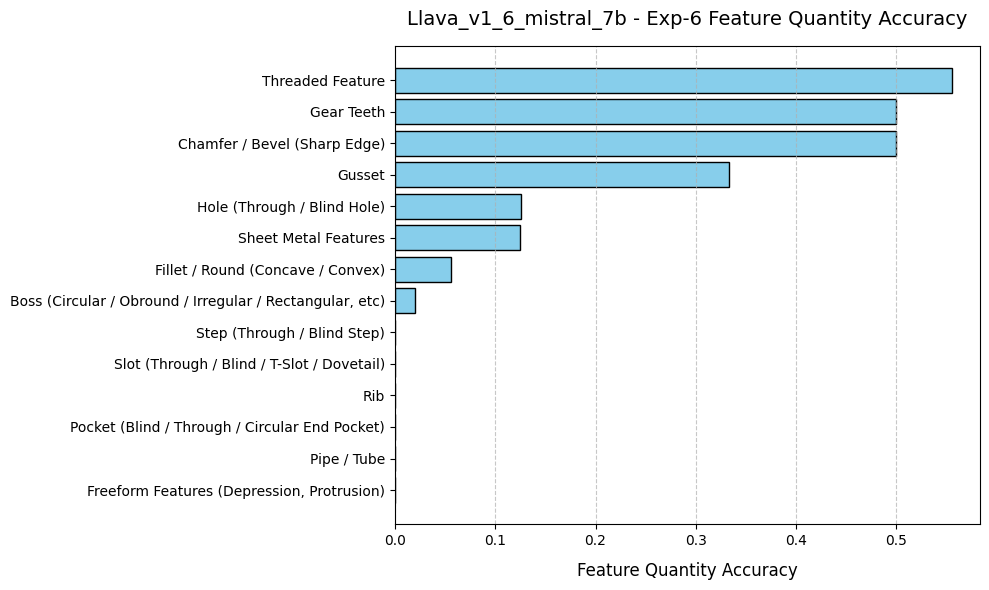

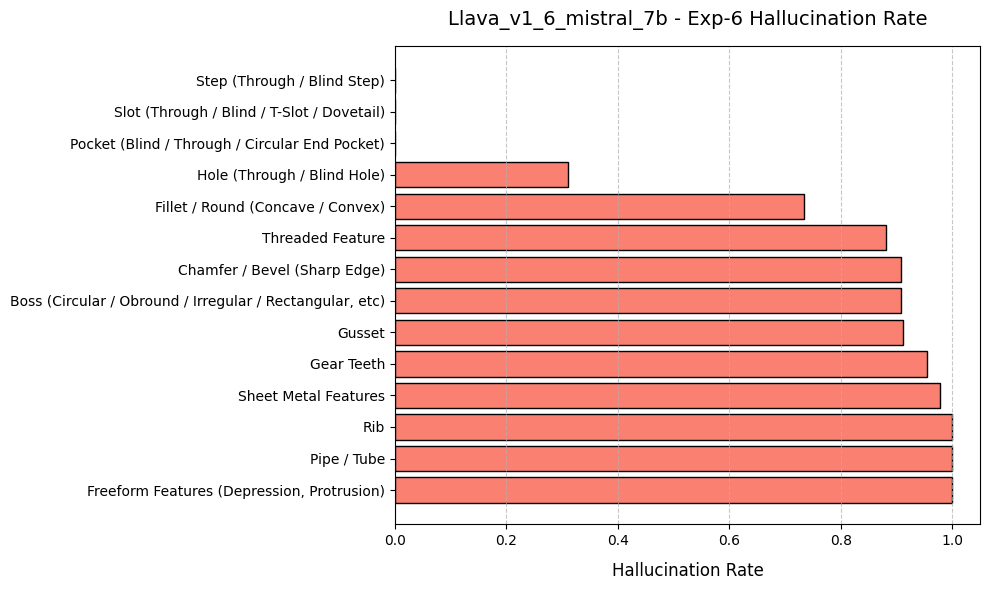

In [14]:
# Loop through each combination of model and experiment and generate plots
for model in models:
    for experiment in experiments_all:
        plot_feature_performance(df_feature_analysis, model, experiment)